In [1]:
import os
import sleap

models_folder = "../models"

In [2]:
# https://sleap.ai/api/sleap.nn.inference.html#sleap.nn.inference.load_model
def get_models(path):
    has_weights = False
    has_config = False
    
    for entry in os.scandir(path):
        if entry.name == 'best_model.h5':
            has_weights = True
        elif entry.name == 'training_config.json':
            has_config = True
        
    if has_weights and has_config:
        return [os.path.abspath(path)]
    else:
        model_paths = []
        
        for entry in os.scandir(path):
            if entry.is_dir():
                model_paths.extend(get_models(entry.path))
        
        return model_paths 

display(get_models(models_folder))

['D:\\Documents\\COMP3850-Group23-Ant-posture\\models\\myee1\\240417_192635.centroid.n=80',
 'D:\\Documents\\COMP3850-Group23-Ant-posture\\models\\myee1\\240417_211609.centered_instance.n=80',
 'D:\\Documents\\COMP3850-Group23-Ant-posture\\models\\myee1\\grayscale.240415_124620.centroid',
 'D:\\Documents\\COMP3850-Group23-Ant-posture\\models\\myee1\\half_size.240416_202503.multi_instance',
 'D:\\Documents\\COMP3850-Group23-Ant-posture\\models\\myee1\\rgb.240415_124620.centroid',
 'D:\\Documents\\COMP3850-Group23-Ant-posture\\models\\myee1\\rgb.240416_121034.multi_instance']

In [8]:
model = 'D:\\Documents\\COMP3850-Group23-Ant-posture\\models\\myee1\\half_size.240416_202503.multi_instance'
video = 'D:\\Downloads\\Ant videos\\remuxed\\Col224_rec.mp4'

In [4]:
predictor = sleap.load_model(model, 1)

In [9]:
video_dat = sleap.load_video(video)
video_dat.num_frames

38492

In [17]:
imgs = video_dat[15000]

In [ ]:
predictions = predictor.predict(imgs)
# predictions.labeled_frames[0].plot_predicted()

In [13]:
top_down = sleap.load_model(['D:\\Documents\\COMP3850-Group23-Ant-posture\\models\\myee1\\240417_192635.centroid.n=80', 'D:\\Documents\\COMP3850-Group23-Ant-posture\\models\\myee1\\240417_211609.centered_instance.n=80'], 2)

In [ ]:
import tensorflow as tf

# Getting a JIT compilation error when using GPU inference, using CPU instead
with tf.device('/CPU:0'):
    top_down_pr = top_down.predict(imgs)

# top_down_pr.labeled_frames[0].plot_predicted()

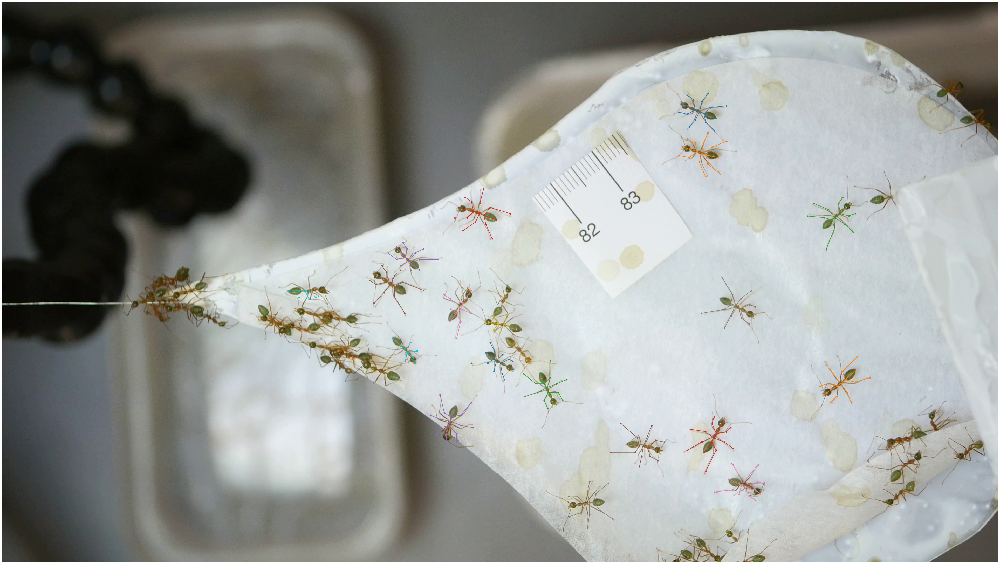

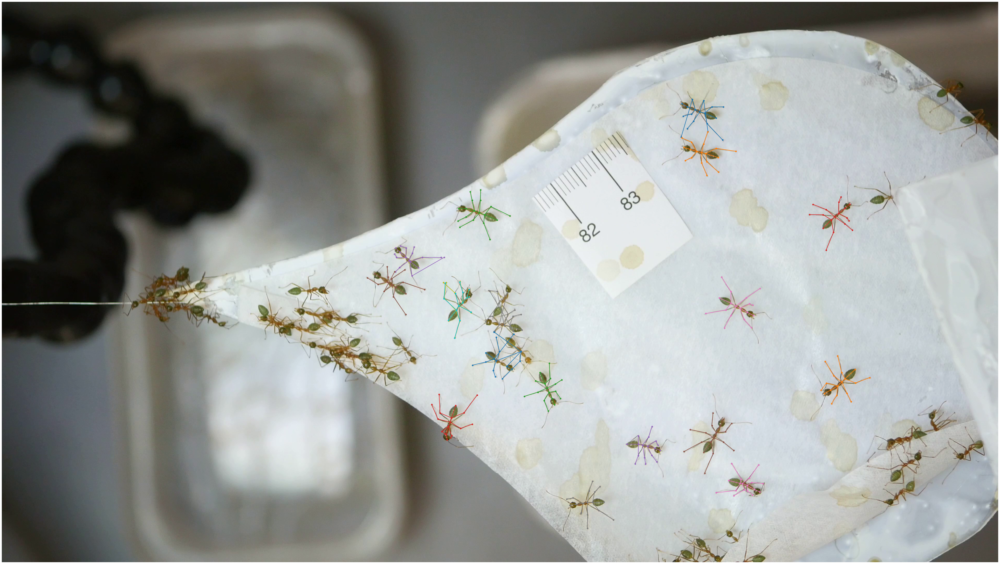

In [20]:
predictions.labeled_frames[0].plot_predicted()
top_down_pr.labeled_frames[0].plot_predicted()